In [5]:
link_fmt = "http://api.worldbank.org/countries/all/indicators/{}/?format=json&date=1960:2014&per_page=20000"
link_life_expectancy = "http://api.worldbank.org/v2/countries/all/indicators/SP.DYN.LE00.IN/?format=json&date=1960:2014&per_page=20000"
link_population_tot = "https://api.worldbank.org/v2/countries/all/indicators/SP.POP.TOTL/?format=json&date=1960:2014&per_page=20000"
link_fertility_rate = "https://api.worldbank.org/v2/countries/all/indicators/SP.DYN.TFRT.IN/?format=json&date=1960:2014&per_page=20000"
link_codes = {'LifeExpectancy':"SP.DYN.LE00.IN", 'Population':"SP.POP.TOTL", 'FertilityRate':"SP.DYN.TFRT.IN"}
 
link_dims = "http://api.worldbank.org/countries/?format=json&per_page=400"

In [6]:
import requests
import pandas as pd

In [7]:
requests.codes.ok

200

### Importare il json countries

In [8]:
data = requests.get(link_dims)
if data.status_code == requests.codes.OK:
    data_json = data.json()
    print(data_json)
else:
    print('Status:', data.status_code,'-', data.reason)

[{'page': 1, 'pages': 1, 'per_page': '400', 'total': 296}, [{'id': 'ABW', 'iso2Code': 'AW', 'name': 'Aruba', 'region': {'id': 'LCN', 'iso2code': 'ZJ', 'value': 'Latin America & Caribbean '}, 'adminregion': {'id': '', 'iso2code': '', 'value': ''}, 'incomeLevel': {'id': 'HIC', 'iso2code': 'XD', 'value': 'High income'}, 'lendingType': {'id': 'LNX', 'iso2code': 'XX', 'value': 'Not classified'}, 'capitalCity': 'Oranjestad', 'longitude': '-70.0167', 'latitude': '12.5167'}, {'id': 'AFE', 'iso2Code': 'ZH', 'name': 'Africa Eastern and Southern', 'region': {'id': 'NA', 'iso2code': 'NA', 'value': 'Aggregates'}, 'adminregion': {'id': '', 'iso2code': '', 'value': ''}, 'incomeLevel': {'id': 'NA', 'iso2code': 'NA', 'value': 'Aggregates'}, 'lendingType': {'id': '', 'iso2code': '', 'value': 'Aggregates'}, 'capitalCity': '', 'longitude': '', 'latitude': ''}, {'id': 'AFG', 'iso2Code': 'AF', 'name': 'Afghanistan', 'region': {'id': 'SAS', 'iso2code': '8S', 'value': 'South Asia'}, 'adminregion': {'id': 'SAS

In [9]:
data_json[1]  # con [1] si evita di prendere l'intestazione del sito

[{'id': 'ABW',
  'iso2Code': 'AW',
  'name': 'Aruba',
  'region': {'id': 'LCN',
   'iso2code': 'ZJ',
   'value': 'Latin America & Caribbean '},
  'adminregion': {'id': '', 'iso2code': '', 'value': ''},
  'incomeLevel': {'id': 'HIC', 'iso2code': 'XD', 'value': 'High income'},
  'lendingType': {'id': 'LNX', 'iso2code': 'XX', 'value': 'Not classified'},
  'capitalCity': 'Oranjestad',
  'longitude': '-70.0167',
  'latitude': '12.5167'},
 {'id': 'AFE',
  'iso2Code': 'ZH',
  'name': 'Africa Eastern and Southern',
  'region': {'id': 'NA', 'iso2code': 'NA', 'value': 'Aggregates'},
  'adminregion': {'id': '', 'iso2code': '', 'value': ''},
  'incomeLevel': {'id': 'NA', 'iso2code': 'NA', 'value': 'Aggregates'},
  'lendingType': {'id': '', 'iso2code': '', 'value': 'Aggregates'},
  'capitalCity': '',
  'longitude': '',
  'latitude': ''},
 {'id': 'AFG',
  'iso2Code': 'AF',
  'name': 'Afghanistan',
  'region': {'id': 'SAS', 'iso2code': '8S', 'value': 'South Asia'},
  'adminregion': {'id': 'SAS', 'iso

In [10]:
pd.json_normalize(data_json[1])

,id,iso2Code,name,capitalCity,longitude,latitude,region.id,region.iso2code,region.value,adminregion.id,adminregion.iso2code,adminregion.value,incomeLevel.id,incomeLevel.iso2code,incomeLevel.value,lendingType.id,lendingType.iso2code,lendingType.value
0,ABW,AW,Aruba,Oranjestad,-70.0167,12.5167,LCN,ZJ,Latin America & Caribbean,,,,HIC,XD,High income,LNX,XX,Not classified
1,AFE,ZH,Africa Eastern and Southern,,,,NA,NA,Aggregates,,,,NA,NA,Aggregates,,,Aggregates
2,AFG,AF,Afghanistan,Kabul,69.1761,34.5228,SAS,8S,South Asia,SAS,8S,South Asia,LIC,XM,Low income,IDX,XI,IDA
3,AFR,A9,Africa,,,,NA,NA,Aggregates,,,,NA,NA,Aggregates,,,Aggregates
4,AFW,ZI,Africa Western and Central,,,,NA,NA,Aggregates,,,,NA,NA,Aggregates,,,Aggregates
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
291,XZN,A5,Sub-Saharan Africa excluding South Africa and ...,,,,NA,NA,Aggregates,,,,NA,NA,Aggregates,,,Aggregates
292,YEM,YE,"Yemen, Rep.",Sana'a,44.2075,15.352,MEA,ZQ,Middle East & North Africa,MNA,XQ,Middle East & North Africa (excluding high inc...,LIC,XM,Low income,IDX,XI,IDA
293,ZAF,ZA,South Africa,Pretoria,28.1871,-25.746,SSF,ZG,Sub-Saharan Africa,SSA,ZF,Sub-Saharan Africa (excluding high income),UMC,XT,Upper middle income,IBD,XF,IBRD
294,ZMB,ZM,Zambia,Lusaka,28.2937,-15.3982,SSF,ZG,Sub-Saharan Africa,SSA,ZF,Sub-Saharan Africa (excluding high income),LMC,XN,Lower middle income,IDX,XI,IDA


In [11]:
# Codice per far apparire solo le colonne selezionate
df = pd.json_normalize(data_json[1])
df_countries = df[['iso2Code', 'name', 'region.value']]

# Rinominare le colonne
mapping_colonne = {'iso2Code': 'IdCountry', 'name': 'Country', 'region.value': 'Region'}

df_countries = df_countries.rename(columns=mapping_colonne)

# Imposta un indice per il DataFrame 'colonne_selezionate'
# colonne_selezionate.set_index(colonne_selezionate.IdCountry, inplace=True)

df_countries

,IdCountry,Country,Region
0,AW,Aruba,Latin America & Caribbean
1,ZH,Africa Eastern and Southern,Aggregates
2,AF,Afghanistan,South Asia
3,A9,Africa,Aggregates
4,ZI,Africa Western and Central,Aggregates
...,...,...,...
291,A5,Sub-Saharan Africa excluding South Africa and ...,Aggregates
292,YE,"Yemen, Rep.",Middle East & North Africa
293,ZA,South Africa,Sub-Saharan Africa
294,ZM,Zambia,Sub-Saharan Africa


### Importare il json life expextancy

In [12]:
data = requests.get(link_life_expectancy)
if data.status_code == requests.codes.OK:
    data_json1 = data.json()
    print(data_json1)
else:
    print('Status:', data.status_code,'-', data.reason)

[{'page': 1, 'pages': 1, 'per_page': 20000, 'total': 14630, 'sourceid': '2', 'lastupdated': '2024-02-21'}, [{'indicator': {'id': 'SP.DYN.LE00.IN', 'value': 'Life expectancy at birth, total (years)'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2014', 'value': 61.3379174832409, 'unit': '', 'obs_status': '', 'decimal': 0}, {'indicator': {'id': 'SP.DYN.LE00.IN', 'value': 'Life expectancy at birth, total (years)'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2013', 'value': 60.7098695610582, 'unit': '', 'obs_status': '', 'decimal': 0}, {'indicator': {'id': 'SP.DYN.LE00.IN', 'value': 'Life expectancy at birth, total (years)'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2012', 'value': 60.0507802468673, 'unit': '', 'obs_status': '', 'decimal': 0}, {'indicator': {'id': 'SP.DYN.LE00.IN', 'value': 'Life expectancy at birth, tota

In [13]:
pd.json_normalize(data_json1[1])

,countryiso3code,date,value,unit,obs_status,decimal,indicator.id,indicator.value,country.id,country.value
0,AFE,2014,61.337917,,,0,SP.DYN.LE00.IN,"Life expectancy at birth, total (years)",ZH,Africa Eastern and Southern
1,AFE,2013,60.709870,,,0,SP.DYN.LE00.IN,"Life expectancy at birth, total (years)",ZH,Africa Eastern and Southern
2,AFE,2012,60.050780,,,0,SP.DYN.LE00.IN,"Life expectancy at birth, total (years)",ZH,Africa Eastern and Southern
3,AFE,2011,59.293271,,,0,SP.DYN.LE00.IN,"Life expectancy at birth, total (years)",ZH,Africa Eastern and Southern
4,AFE,2010,58.411150,,,0,SP.DYN.LE00.IN,"Life expectancy at birth, total (years)",ZH,Africa Eastern and Southern
...,...,...,...,...,...,...,...,...,...,...
14625,ZWE,1964,54.994000,,,0,SP.DYN.LE00.IN,"Life expectancy at birth, total (years)",ZW,Zimbabwe
14626,ZWE,1963,54.549000,,,0,SP.DYN.LE00.IN,"Life expectancy at birth, total (years)",ZW,Zimbabwe
14627,ZWE,1962,54.071000,,,0,SP.DYN.LE00.IN,"Life expectancy at birth, total (years)",ZW,Zimbabwe
14628,ZWE,1961,53.619000,,,0,SP.DYN.LE00.IN,"Life expectancy at birth, total (years)",ZW,Zimbabwe


In [14]:
# Codice per far apparire solo le colonne selezionate
df1 = pd.json_normalize(data_json1[1])
df_life_expectancy = df1[['date', 'value', 'country.id']]

# Rinominare le colonne
mapping_colonne1= {'date': 'Date', 'value': 'LifeExpectancy', 'country.id': 'IdCountry'}

df_life_expectancy = df_life_expectancy.rename(columns=mapping_colonne1)

# Imposta un indice per il DataFrame 'colonne_selezionate'
# colonne_selezionate1.set_index(colonne_selezionate1.IdCountry, inplace=True)

df_life_expectancy

,Date,LifeExpectancy,IdCountry
0,2014,61.337917,ZH
1,2013,60.709870,ZH
2,2012,60.050780,ZH
3,2011,59.293271,ZH
4,2010,58.411150,ZH
...,...,...,...
14625,1964,54.994000,ZW
14626,1963,54.549000,ZW
14627,1962,54.071000,ZW
14628,1961,53.619000,ZW


### Importare il json life population

In [15]:
import requests

link_population_tot = "https://api.worldbank.org/v2/countries/all/indicators/SP.POP.TOTL/?format=json&date=1960:2014&per_page=20000"

data = requests.get(link_population_tot)

if data.status_code == requests.codes.ok:
    data_json2 = data.json()
    print(data_json2)
else:
    print('Status:', data.status_code,'-', data.reason)

[{'page': 1, 'pages': 1, 'per_page': 20000, 'total': 14630, 'sourceid': '2', 'lastupdated': '2024-02-21'}, [{'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2014', 'value': 583651101, 'unit': '', 'obs_status': '', 'decimal': 0}, {'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2013', 'value': 567892149, 'unit': '', 'obs_status': '', 'decimal': 0}, {'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2012', 'value': 552530654, 'unit': '', 'obs_status': '', 'decimal': 0}, {'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2011', '

In [16]:
pd.json_normalize(data_json2[1])

,countryiso3code,date,value,unit,obs_status,decimal,indicator.id,indicator.value,country.id,country.value
0,AFE,2014,583651101.0,,,0,SP.POP.TOTL,"Population, total",ZH,Africa Eastern and Southern
1,AFE,2013,567892149.0,,,0,SP.POP.TOTL,"Population, total",ZH,Africa Eastern and Southern
2,AFE,2012,552530654.0,,,0,SP.POP.TOTL,"Population, total",ZH,Africa Eastern and Southern
3,AFE,2011,537792950.0,,,0,SP.POP.TOTL,"Population, total",ZH,Africa Eastern and Southern
4,AFE,2010,523459657.0,,,0,SP.POP.TOTL,"Population, total",ZH,Africa Eastern and Southern
...,...,...,...,...,...,...,...,...,...,...
14625,ZWE,1964,4310332.0,,,0,SP.POP.TOTL,"Population, total",ZW,Zimbabwe
14626,ZWE,1963,4177931.0,,,0,SP.POP.TOTL,"Population, total",ZW,Zimbabwe
14627,ZWE,1962,4049778.0,,,0,SP.POP.TOTL,"Population, total",ZW,Zimbabwe
14628,ZWE,1961,3925952.0,,,0,SP.POP.TOTL,"Population, total",ZW,Zimbabwe


In [17]:
# Codice per far apparire solo le colonne selezionate
df2 = pd.json_normalize(data_json2[1])
df_population = df2[['date', 'value', 'country.id']]

# Rinominare le colonne
mapping_colonne2= {'date': 'Date', 'value': 'TotPopulation', 'country.id': 'IdCountry'}

df_population = df_population.rename(columns=mapping_colonne2)

# Imposta un indice per il DataFrame 'colonne_selezionate'
# colonne_selezionate1.set_index(colonne_selezionate1.IdCountry, inplace=True)

df_population

,Date,TotPopulation,IdCountry
0,2014,583651101.0,ZH
1,2013,567892149.0,ZH
2,2012,552530654.0,ZH
3,2011,537792950.0,ZH
4,2010,523459657.0,ZH
...,...,...,...
14625,1964,4310332.0,ZW
14626,1963,4177931.0,ZW
14627,1962,4049778.0,ZW
14628,1961,3925952.0,ZW


### Importare il json fertility

In [18]:
import requests

link_fertility_rate = "https://api.worldbank.org/v2/countries/all/indicators/SP.DYN.TFRT.IN/?format=json&date=1960:2014&per_page=20000"

data = requests.get(link_population_tot)

if data.status_code == requests.codes.ok:
    data_json3 = data.json()
    print(data_json3)
else:
    print('Status:', data.status_code,'-', data.reason)

[{'page': 1, 'pages': 1, 'per_page': 20000, 'total': 14630, 'sourceid': '2', 'lastupdated': '2024-02-21'}, [{'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2014', 'value': 583651101, 'unit': '', 'obs_status': '', 'decimal': 0}, {'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2013', 'value': 567892149, 'unit': '', 'obs_status': '', 'decimal': 0}, {'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2012', 'value': 552530654, 'unit': '', 'obs_status': '', 'decimal': 0}, {'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'}, 'country': {'id': 'ZH', 'value': 'Africa Eastern and Southern'}, 'countryiso3code': 'AFE', 'date': '2011', '

In [19]:
pd.json_normalize(data_json3[1])

,countryiso3code,date,value,unit,obs_status,decimal,indicator.id,indicator.value,country.id,country.value
0,AFE,2014,583651101.0,,,0,SP.POP.TOTL,"Population, total",ZH,Africa Eastern and Southern
1,AFE,2013,567892149.0,,,0,SP.POP.TOTL,"Population, total",ZH,Africa Eastern and Southern
2,AFE,2012,552530654.0,,,0,SP.POP.TOTL,"Population, total",ZH,Africa Eastern and Southern
3,AFE,2011,537792950.0,,,0,SP.POP.TOTL,"Population, total",ZH,Africa Eastern and Southern
4,AFE,2010,523459657.0,,,0,SP.POP.TOTL,"Population, total",ZH,Africa Eastern and Southern
...,...,...,...,...,...,...,...,...,...,...
14625,ZWE,1964,4310332.0,,,0,SP.POP.TOTL,"Population, total",ZW,Zimbabwe
14626,ZWE,1963,4177931.0,,,0,SP.POP.TOTL,"Population, total",ZW,Zimbabwe
14627,ZWE,1962,4049778.0,,,0,SP.POP.TOTL,"Population, total",ZW,Zimbabwe
14628,ZWE,1961,3925952.0,,,0,SP.POP.TOTL,"Population, total",ZW,Zimbabwe


In [20]:
# Codice per far apparire solo le colonne selezionate
df3 = pd.json_normalize(data_json3[1])
df_fertility_rate = df3[['date', 'value', 'country.id']]

# Rinominare le colonne
mapping_colonne3= {'date': 'Date', 'value': 'FertilityRate', 'country.id': 'IdCountry'}

df_fertility_rate = df_fertility_rate.rename(columns=mapping_colonne3)

# Imposta un indice per il DataFrame 'colonne_selezionate'
# colonne_selezionate1.set_index(colonne_selezionate1.IdCountry, inplace=True)

df_fertility_rate

,Date,FertilityRate,IdCountry
0,2014,583651101.0,ZH
1,2013,567892149.0,ZH
2,2012,552530654.0,ZH
3,2011,537792950.0,ZH
4,2010,523459657.0,ZH
...,...,...,...
14625,1964,4310332.0,ZW
14626,1963,4177931.0,ZW
14627,1962,4049778.0,ZW
14628,1961,3925952.0,ZW


### Usare la funzione merge per unire le tabelle

In [21]:
# Unisci df1 e df2 in base a una colonna comune
merge_df = pd.merge(df_countries, df_life_expectancy, on='IdCountry')

# Unisci merged_df con df3 in base a una colonna comune
merge_df1 = pd.merge(merge_df,df_population , on=['Date', 'IdCountry'])

merge_df2 = pd.merge(merge_df1,df_fertility_rate , on=['Date', 'IdCountry'])
merge_df2

,IdCountry,Country,Region,Date,LifeExpectancy,TotPopulation,FertilityRate
0,AW,Aruba,Latin America & Caribbean,2014,75.601,103594.0,103594.0
1,AW,Aruba,Latin America & Caribbean,2013,75.636,102880.0,102880.0
2,AW,Aruba,Latin America & Caribbean,2012,75.531,102112.0,102112.0
3,AW,Aruba,Latin America & Caribbean,2011,75.465,101288.0,101288.0
4,AW,Aruba,Latin America & Caribbean,2010,75.404,100341.0,100341.0
...,...,...,...,...,...,...,...
14625,ZW,Zimbabwe,Sub-Saharan Africa,1964,54.994,4310332.0,4310332.0
14626,ZW,Zimbabwe,Sub-Saharan Africa,1963,54.549,4177931.0,4177931.0
14627,ZW,Zimbabwe,Sub-Saharan Africa,1962,54.071,4049778.0,4049778.0
14628,ZW,Zimbabwe,Sub-Saharan Africa,1961,53.619,3925952.0,3925952.0


### Top 10 paesi con l'aspettativa di vita più alta nel 1960

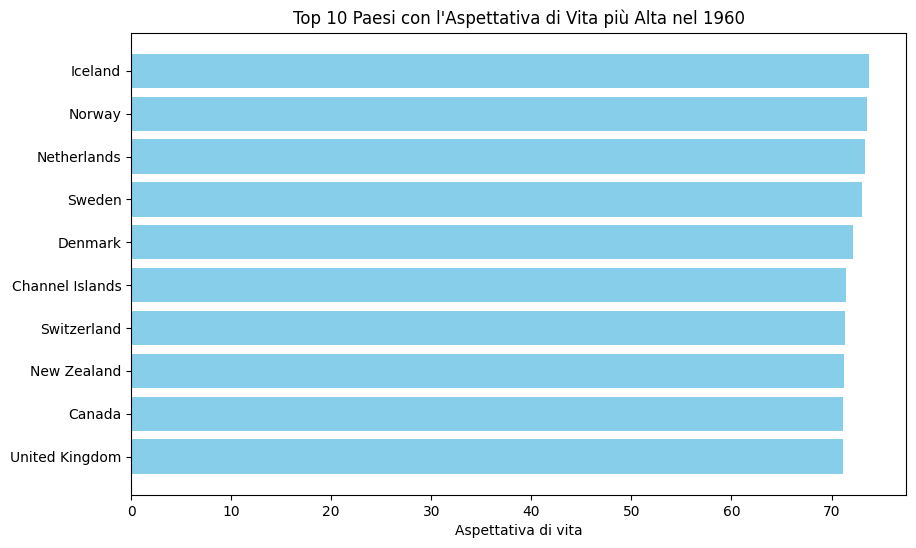

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

# Filtra i dati per l'anno 1960
data_1960 = merge_df2[merge_df2['Date'] == '1960']

# Verifica i dati filtrati
#print(data_1960.head())

# Ordina i dati per aspettativa di vita in ordine decrescente
data_1960_sorted = data_1960.sort_values(by='LifeExpectancy', ascending=False)

# Verifica i dati ordinati
#print(data_1960_sorted.head())

# Seleziona i primi 10 paesi
top_10_countries_1960 = data_1960_sorted.head(10)

# Crea il grafico
plt.figure(figsize=(10, 6))
plt.barh(top_10_countries_1960['Country'], top_10_countries_1960['LifeExpectancy'], color='skyblue')
plt.xlabel('Aspettativa di vita')
plt.title('Top 10 Paesi con l\'Aspettativa di Vita più Alta nel 1960')
plt.gca().invert_yaxis()  # Inverti l'asse y per mostrare il paese con l'aspettativa di vita più alta in cima
plt.show()


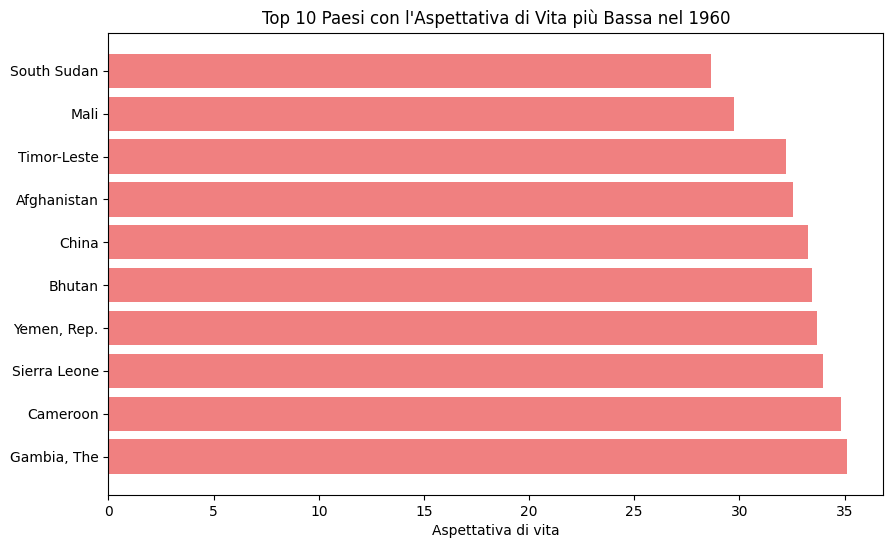

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# Filtra i dati per l'anno 1960
data_1960 = merge_df2[merge_df2['Date'] == '1960']

# Ordina i dati per aspettativa di vita in ordine ascendente
data_1960_sorted = data_1960.sort_values(by='LifeExpectancy', ascending=True)

# Seleziona i primi 10 paesi
bottom_10_countries_1960 = data_1960_sorted.head(10)

# Crea il grafico
plt.figure(figsize=(10, 6))
plt.barh(bottom_10_countries_1960['Country'], bottom_10_countries_1960['LifeExpectancy'], color='lightcoral')
plt.xlabel('Aspettativa di vita')
plt.title('Top 10 Paesi con l\'Aspettativa di Vita più Bassa nel 1960')
plt.gca().invert_yaxis()  # Inverti l'asse y per mostrare il paese con l'aspettativa di vita più bassa in cima
plt.show()


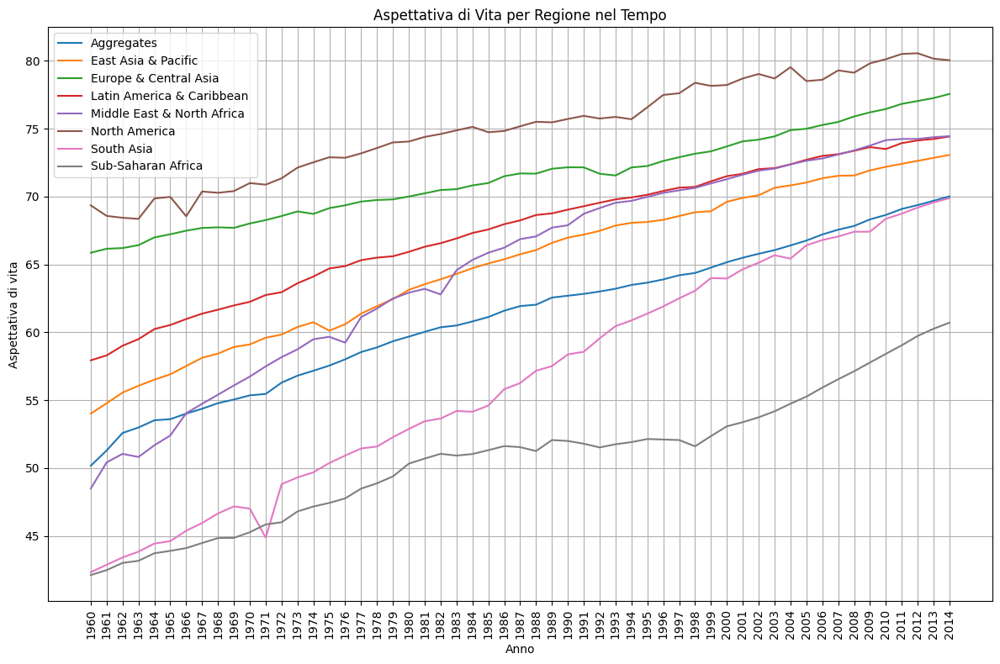

In [39]:
import pandas as pd
import matplotlib.pyplot as plt

# Raggruppa i dati per regione e anno e calcola la media dell'aspettativa di vita
grouped_data = merge_df2.groupby(['Region', 'Date'])['LifeExpectancy'].mean().reset_index()

# Crea il grafico
plt.figure(figsize=(12, 8))

# Itera attraverso ciascuna regione
for region in grouped_data['Region'].unique():
    region_data = grouped_data[grouped_data['Region'] == region]
    plt.plot(region_data['Date'], region_data['LifeExpectancy'], label=region)

# Aggiungi le etichette e il titolo
plt.xlabel('Anno')
plt.ylabel('Aspettativa di vita')
plt.title('Aspettativa di Vita per Regione nel Tempo')
plt.legend()
plt.grid(True)

# Imposta le etichette dell'asse x e ruota di 90 gradi per migliorare la leggibilità
plt.xticks(rotation=90)
plt.tight_layout()  # Per evitare sovrapposizioni
plt.show()
